In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import json

with open('/content/drive/MyDrive/학부연구생/재료/Metalical glass/MG 논문/ANN_result_20.json', 'r') as f:
  ANN_results = json.load(f)
with open('/content/drive/MyDrive/학부연구생/재료/Metalical glass/MG 논문/XGB_result_20.json', 'r') as f:
  XGB_results = json.load(f)
with open('/content/drive/MyDrive/학부연구생/재료/Metalical glass/MG 논문/LGBM_result_20.json', 'r') as f:
  LGBM_results = json.load(f)
with open('/content/drive/MyDrive/학부연구생/재료/Metalical glass/MG 논문/RF_result_20.json', 'r') as f:
  RF_results = json.load(f)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from math import pi
from matplotlib.path import Path
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D


In [ ]:
ANN_results

{'total_accuracy': [0.8948625180897251,
  0.8969247467438496,
  0.8944283646888568,
  0.8965267727930535,
  0.8959840810419681,
  0.8950795947901591,
  0.8950434153400868,
  0.8892908827785819,
  0.8886034732272069,
  0.8859261939218523,
  0.8907742402315485,
  0.8929811866859625,
  0.891751085383502,
  0.8798842257597684,
  0.8201881331403762,
  0.7629522431259045,
  0.7425470332850941,
  0.7346599131693197,
  0.7301013024602024,
  0.7246020260492039],
 'total_precision': [0.9101901109293452,
  0.912187987008204,
  0.9113329654866581,
  0.9132579374258661,
  0.9136533158857606,
  0.9115015321467215,
  0.9096508217589729,
  0.9072973314820153,
  0.9052195131882022,
  0.9034695570378976,
  0.9070123639397059,
  0.9078804559572674,
  0.910264735443423,
  0.8990266315777958,
  0.8359847398323005,
  0.763918047495086,
  0.7418507588283194,
  0.7324808213077404,
  0.7285298398835516,
  0.7245223841026289],
 'total_recall': [0.9485014985014985,
  0.949150849150849,
  0.9464535464535464,
  0.

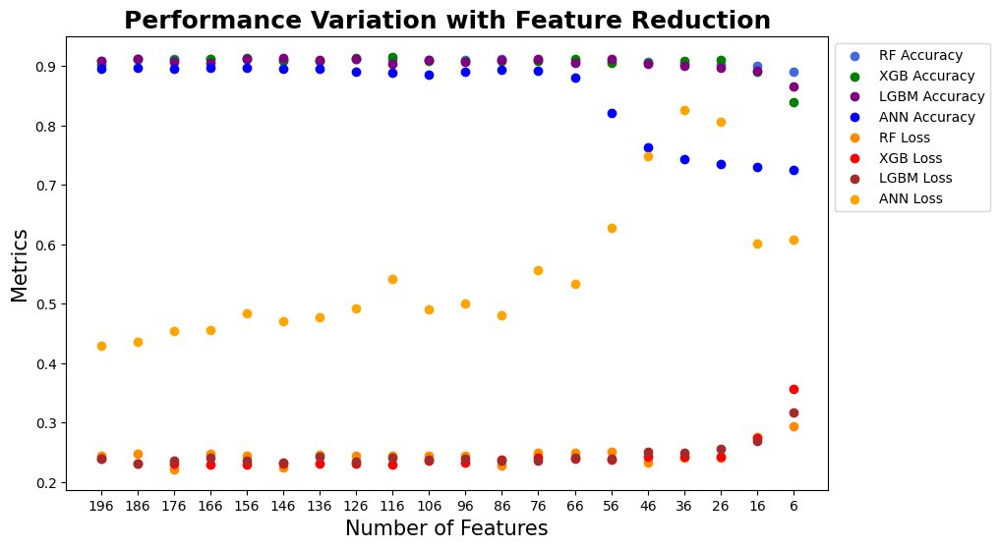

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 그림과 축 생성
fig, ax = plt.subplots(figsize=(10, 6))

# 산점도를 사용하여 정확도와 손실 플로팅
start_value = 6
step_value = +10
end_value = 196
custom_labels = list(range(start_value, end_value + 1, step_value))

# 정확도
ax.scatter(custom_labels, RF_results['total_accuracy'], color='royalblue', marker='o', label='RF Accuracy')
ax.scatter(custom_labels, XGB_results['total_accuracy'], color='green', marker='o', label='XGB Accuracy')
ax.scatter(custom_labels, LGBM_results['total_accuracy'], color='purple', marker='o', label='LGBM Accuracy')
ax.scatter(custom_labels, ANN_results['total_accuracy'], color='blue', marker='o', label='ANN Accuracy')

# Loss
ax.scatter(custom_labels, RF_results['total_loss'], color='darkorange', marker='o', label='RF Loss')
ax.scatter(custom_labels, XGB_results['total_loss'], color='red', marker='o', label='XGB Loss')
ax.scatter(custom_labels, LGBM_results['total_loss'], color='brown', marker='o', label='LGBM Loss')
ax.scatter(custom_labels, ANN_results['total_loss'], color='orange', marker='o', label='ANN Loss')

# x 축 눈금 위치 및 라벨 설정
ax.set_xticks(custom_labels)
ax.set_xticklabels(custom_labels[::-1])

# 라벨 및 제목 설정
ax.set_xlabel('Number of Features', fontsize=15)
ax.set_ylabel('Metrics', fontsize=15)
ax.set_title('Performance Variation with Feature Reduction', fontsize=18, fontweight='bold')

# 범례 표시
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# 그림 표시
plt.show()


## 특성 감소에 따른 성능 변화 그래프

In [ ]:
def Performance_Variation(model_results, model_name):

  fig, ax1 = plt.subplots(figsize=(8, 6))

  start_value = 6
  step_value = +10
  end_value = 196
  custom_labels = list(range(start_value, end_value + 1, step_value))

  # x 축 눈금 위치 설정
  ax1.set_xticks(custom_labels)
  ax1.set_xticklabels(custom_labels[::-1])

  # y축 왼쪽 accuracy
  ax1.scatter(custom_labels, model_results['total_accuracy'], color='royalblue', marker='o', label='accuracy')
  ax1.set_xlabel('Number of Features', fontsize=15)
  ax1.set_ylabel('Accuracy', fontsize=15)
  ax1.tick_params(axis='y')

  ax1.set_ylim([0.70, 1.0])

  # y축 오른쪽 log loss
  ax2 = ax1.twinx()
  ax2.scatter(custom_labels, model_results['total_loss'], color='darkorange', marker='o', label='    loss    ')
  ax2.set_ylabel('Loss', fontsize=15)
  ax2.tick_params(axis='y'


  # 제목 설정 및 플롯 표시
  plt.title(f'Performance Variation of {model_name} with Feature Reduction', fontsize=13, fontweight='bold')
  ax1.legend(loc='upper left')
  ax2.legend(loc='upper left', bbox_to_anchor=(0, 0.94))
  plt.show()


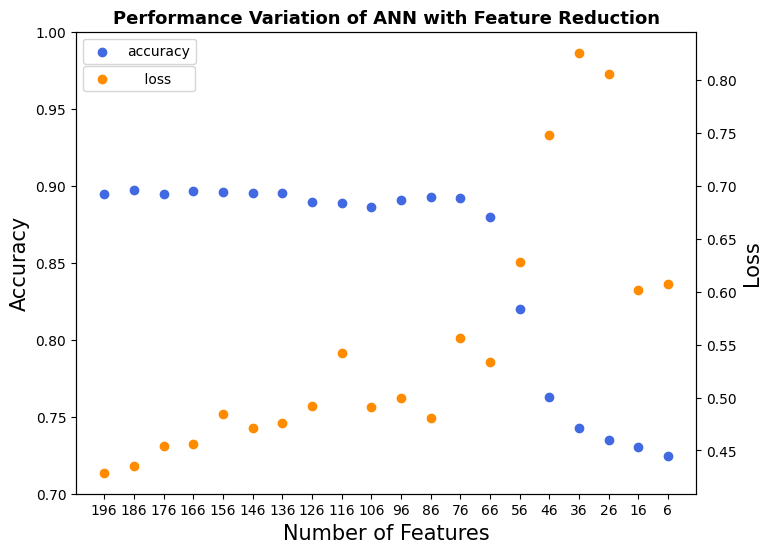

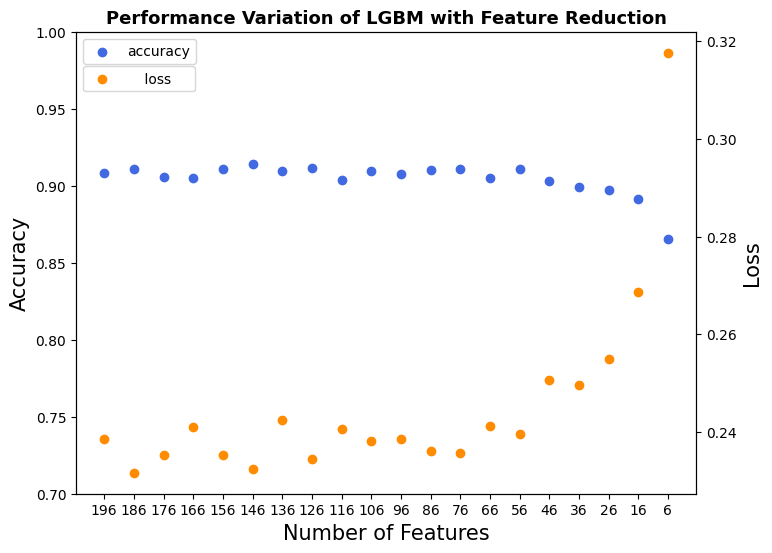

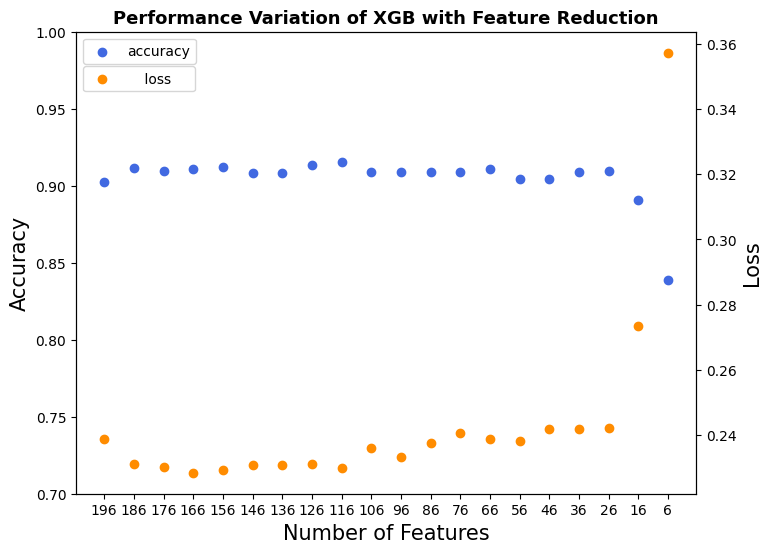

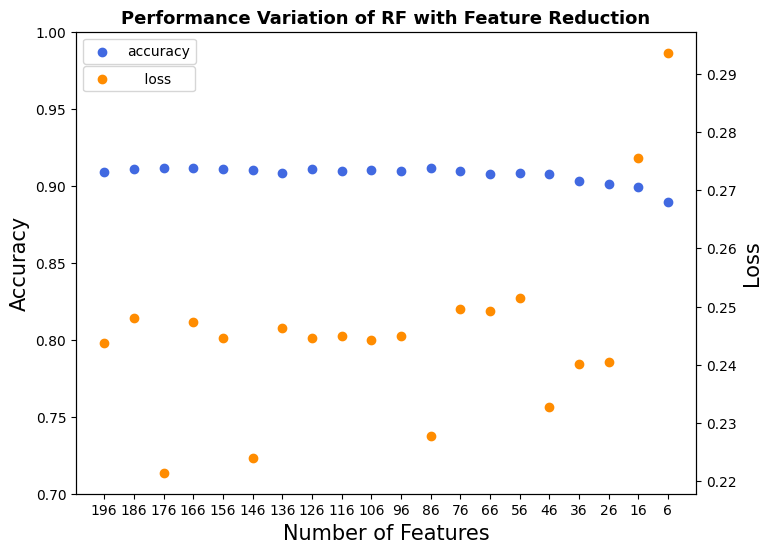

In [ ]:
Performance_Variation(ANN_results, 'ANN')
Performance_Variation(LGBM_results, 'LGBM')
Performance_Variation(XGB_results, 'XGB')
Performance_Variation(RF_results, 'RF')

## Confusion matrix plot

In [ ]:
def plot_confusion_matrix(model_results, model_name):
  class_labels = ['Non-MG', 'MG']

  # 전체 subplot의 행과 열 개수 설정
  num_rows = 4
  num_cols = 5

  # 전체 subplot 크기 설정
  fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 24))

  # 각 실험에 대한 혼동 행렬 시각화
  for i in range(len(model_results['total_confusion'])):
      row = i // num_cols
      col = i % num_cols
      numbers = list(range(196, 5, -10))
      confusion = model_results['total_confusion'][i]

      # 혼동 행렬 내부의 값들을 정수로 변환
      confusion = [[int(value) for value in row] for row in confusion]

      # 혼동 행렬 시각화
      sns.heatmap(confusion, annot=True, fmt='d', cmap='YlOrRd', cbar=False,
                  annot_kws={'size': 12, 'weight': 'bold'},
                  linewidths=2, linecolor='black', ax=axes[row, col])

      axes[row, col].set_xticks(np.arange(len(class_labels)) + 0.5)
      axes[row, col].set_yticks(np.arange(len(class_labels)) + 0.5)
      axes[row, col].set_xticklabels(class_labels, fontsize=12)
      axes[row, col].set_yticklabels(class_labels, fontsize=12)
      axes[row, col].set_xlabel('Predicted Label', fontsize=14)
      axes[row, col].set_ylabel('True Label', fontsize=14)
      axes[row, col].set_title(f'{model_name}model Number of features {numbers[i]}', fontsize=14, fontweight='bold')

  # 전체 subplot 레이아웃 조정
  plt.tight_layout()
  plt.show()


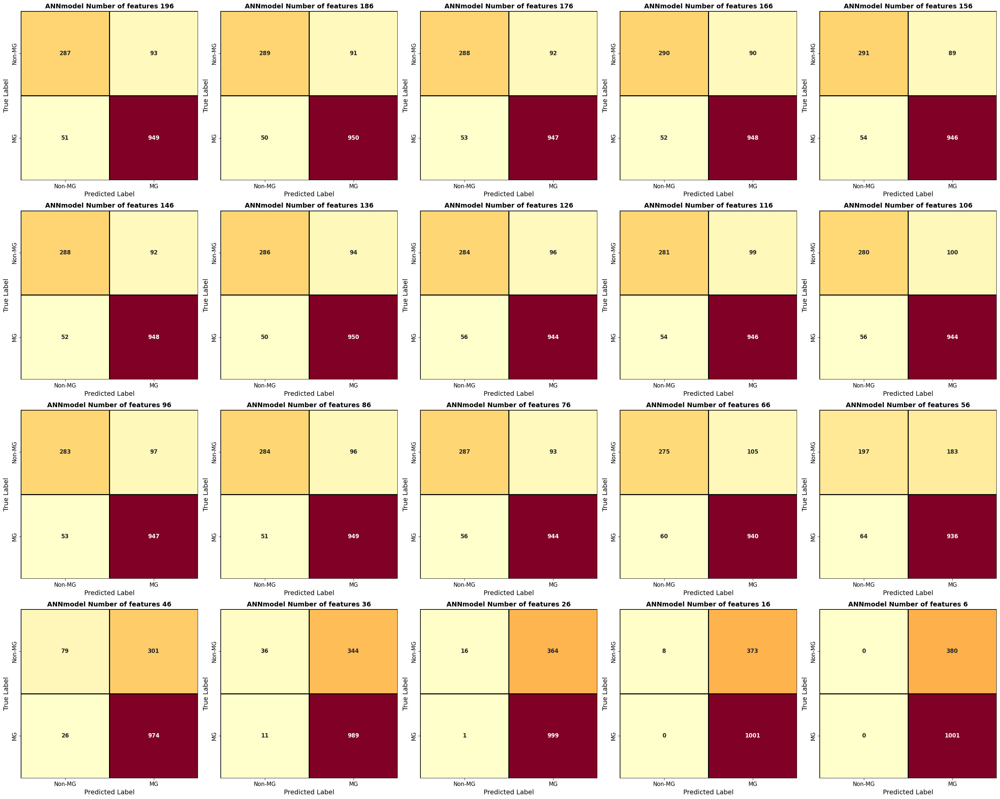

In [ ]:
plot_confusion_matrix(ANN_results, 'ANN')

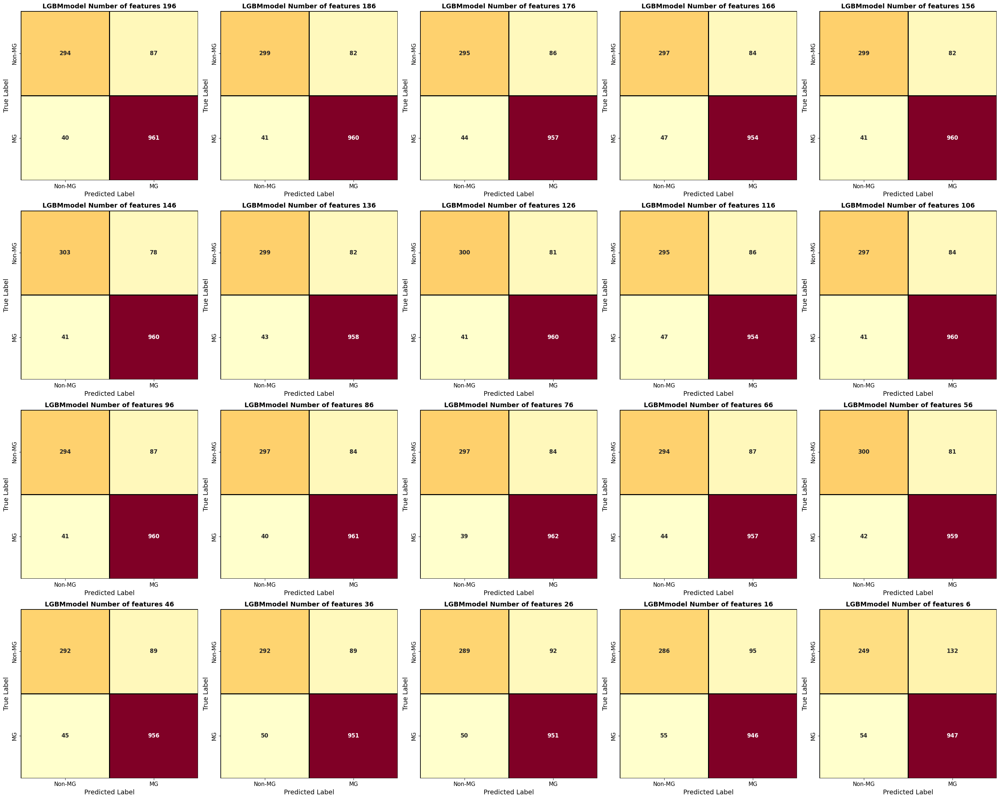

In [ ]:
plot_confusion_matrix(LGBM_results, 'LGBM')

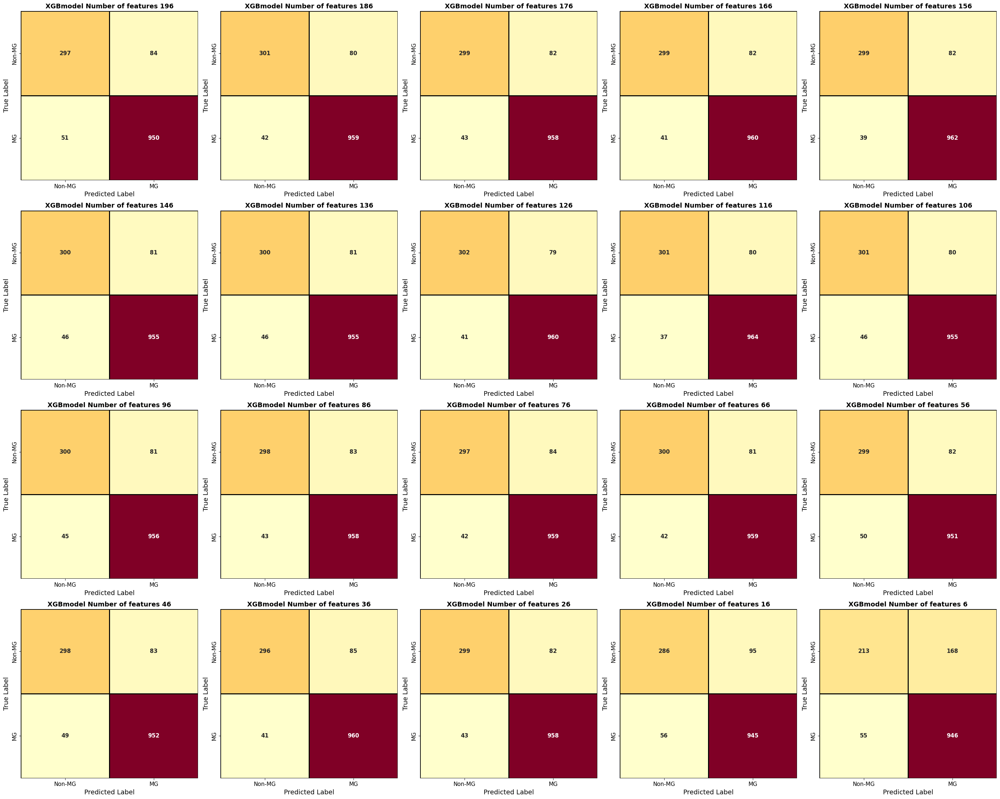

In [ ]:
plot_confusion_matrix(XGB_results, 'XGB')

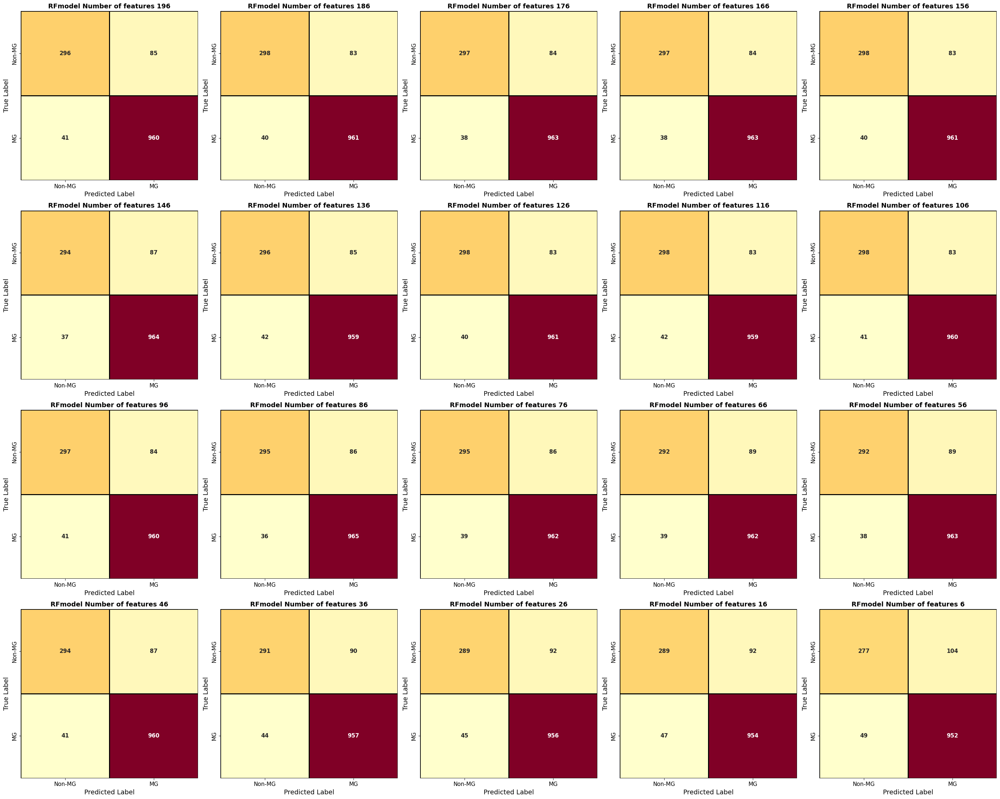

In [ ]:
plot_confusion_matrix(RF_results, 'RF')

## rader chart plot 6 metrics

In [ ]:
def plot_6_metrics_rader_chart(model_results, model_name):

  df = pd.DataFrame({
                'Character': ['196 dataset','186 dataset','176 dataset','166 dataset','156 dataset',
                              '146 dataset','136 dataset','126 dataset','116 dataset','106 dataset',
                              '96 dataset','86 dataset','76 dataset','66 dataset','56 dataset',
                              '46 dataset','36 dataset','26 dataset','16 dataset','6 dataset'],
                'Accuracy': model_results['total_accuracy'],
                'Precision': model_results['total_precision'],
                'Recall': model_results['total_recall'],
                'F1-score': model_results['total_f1'],
                'ROC-AUC': model_results['total_roc_auc'],
                'Loss' : model_results['total_loss']
  })


  labels = df.columns[1:]
  num_labels = len(labels)

  angles = [x/float(num_labels)*(2*pi) for x in range(num_labels)] ## 각 등분점
  angles += angles[:1] ## 시작점으로 다시 돌아와야하므로 시작점 추가

  my_palette = plt.cm.get_cmap("tab20", len(df.index))

  fig = plt.figure(figsize=(35,45))
  fig.set_facecolor('white')

  for i, row in df.iterrows():
      color = my_palette(i)
      data = df.iloc[i].drop('Character').tolist()
      data += data[:1]

      ax = plt.subplot(5,4,i+1, polar=True)
      ax.set_theta_offset(pi / 2) ## 시작점
      ax.set_theta_direction(-1) ## 그려지는 방향 시계방향

      plt.xticks(angles[:-1], labels, fontsize=30) ## x축 눈금 라벨
      ax.tick_params(axis='x', which='major', pad=40) ## x축과 눈금 사이에 여백을 준다.

      ax.set_rlabel_position(0) ## y축 각도 설정(degree 단위)

      # plt.yscale('log')
      plt.yticks([0, 0.2,0.4,0.6,0.8,1.0],['0', '0.2','0.4','0.6','0.8','1.0'], fontsize=20) ## y축 눈금 설정
      plt.ylim(0,1)

      ax.plot(angles, data, color=color, linewidth=3, linestyle='solid') ## 레이더 차트 출력
      ax.fill(angles, data, color=color, alpha=0.3) ## 도형 안쪽에 색을 채워준다.

      plt.title(row.Character, size=30, color=color,x=-0.2, y=1.2, ha='left') ## 타이틀은 캐릭터 클래스로 한다.

  plt.tight_layout(pad=5) ## subplot간 패딩 조절
  plt.show()

<ipython-input-21-8ae8075d9b91>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("tab20", len(df.index))


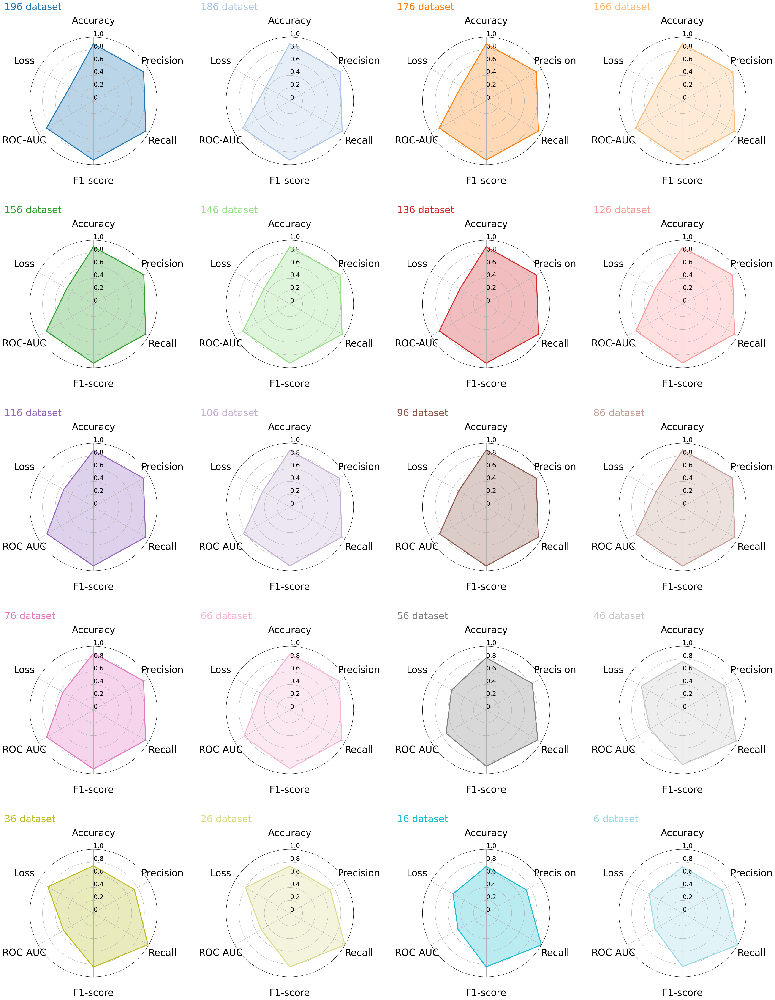

In [ ]:
plot_6_metrics_rader_chart(ANN_results,'ANN_results')

<ipython-input-21-8ae8075d9b91>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("tab20", len(df.index))


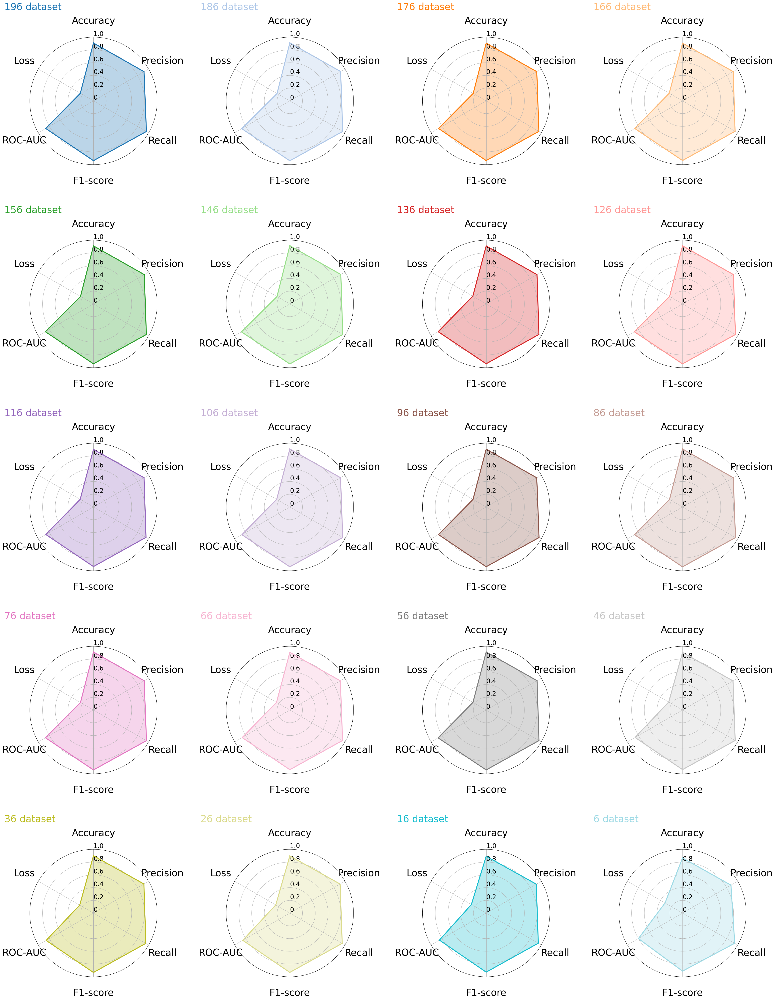

In [ ]:
plot_6_metrics_rader_chart(LGBM_results,'LGBM_results')

<ipython-input-21-8ae8075d9b91>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("tab20", len(df.index))


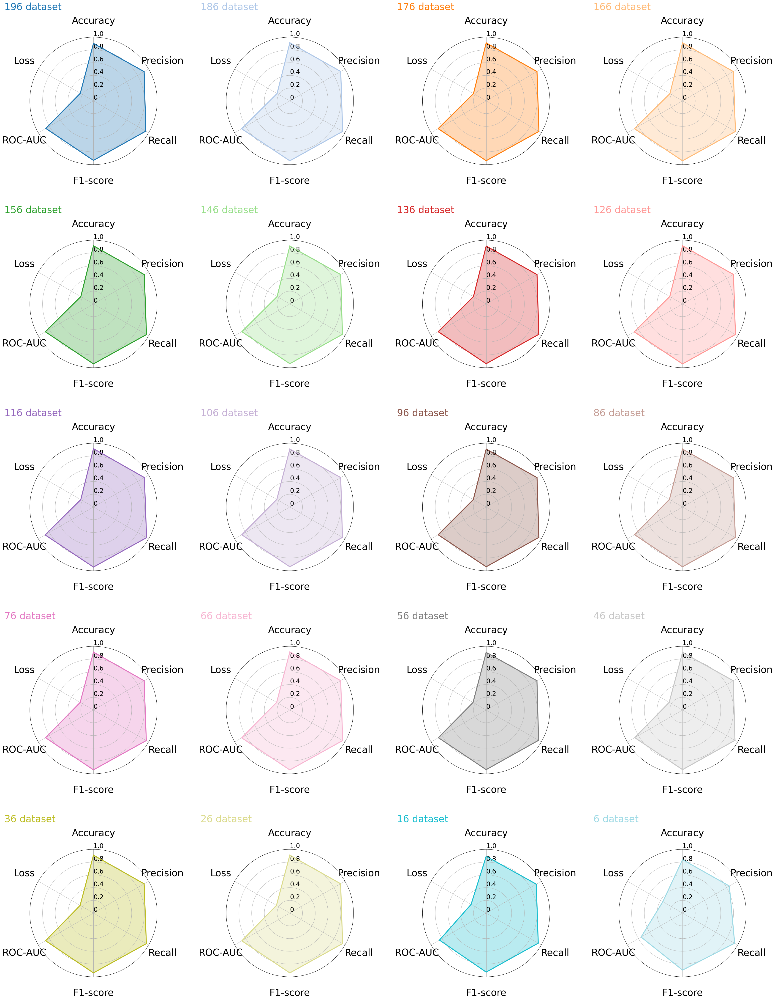

In [ ]:
plot_6_metrics_rader_chart(XGB_results,'XGB_results')

<ipython-input-21-8ae8075d9b91>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("tab20", len(df.index))


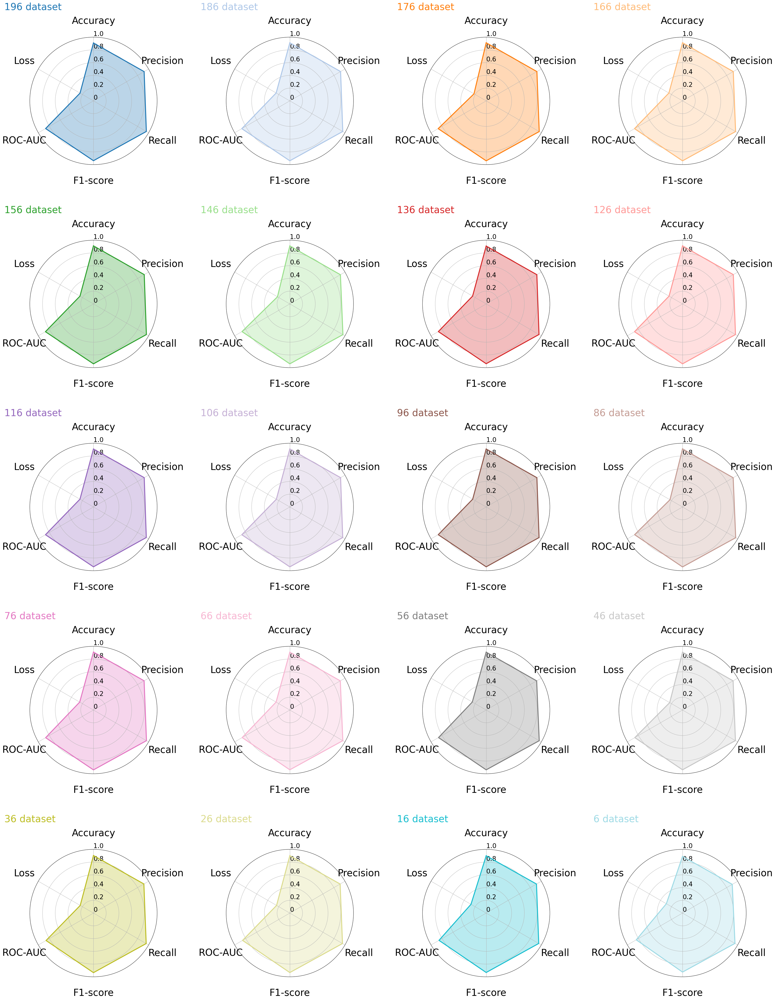

In [ ]:
plot_6_metrics_rader_chart(RF_results,'RF_results')

## ROC_AUC curve plot

In [ ]:
def plot_roc_curve(data_results, data_name):
  # 전체 subplot의 행과 열 개수 설정
  num_rows = 4
  num_cols = 5

  # 전체 subplot 크기 설정
  fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 16))

  # 각 실험에 대한 ROC Curve 그리기
  for i in range(len(data_results['fps_roc_auc'])):
      numbers = list(range(196, 5, -10))
      row = i // num_cols
      col = i % num_cols

      # 실험에 대한 fps 및 tps 가져오기
      fps = data_results['fps_roc_auc'][i]
      tps = data_results['tps_roc_auc'][i]

      # AUC 계산
      roc_auc = data_results['total_roc_auc'][i]

      # ROC Curve 그리기
      axes[row, col].plot(fps, tps, color='C2', label='ROC Curve (AUC = {:.3f})'.format(roc_auc), linewidth=3)
      axes[row, col].plot([0, 1], [0, 1], color='C1', linestyle='--', linewidth=3)
      axes[row, col].set_xlim([0.0, 1.0])
      axes[row, col].set_ylim([0.0, 1.0])
      axes[row, col].set_xlabel('False Positive Rate', fontsize=14, fontweight='bold')
      axes[row, col].set_ylabel('True Positive Rate', fontsize=14, fontweight='bold')
      axes[row, col].set_title('No of feature {}: {} ROC Curve'.format(numbers[i], data_name), fontsize=13, fontweight='bold')
      axes[row, col].legend(loc='lower right')

  # 전체 subplot 레이아웃 조정
  plt.tight_layout()
  plt.show()

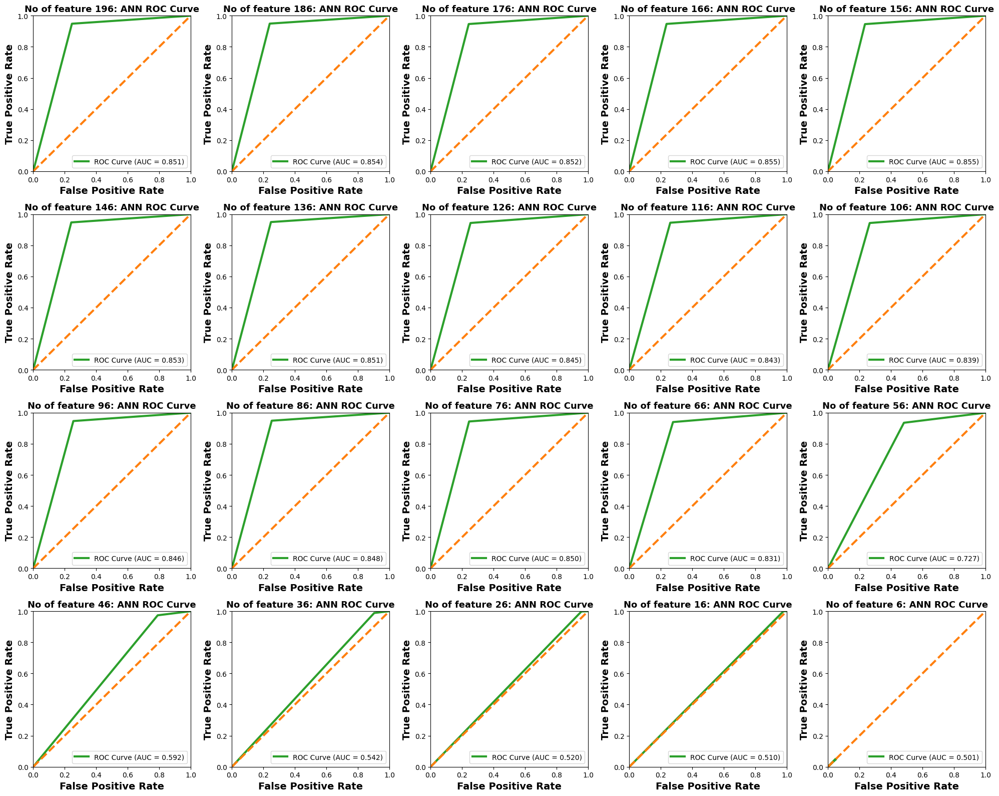

In [ ]:
plot_roc_curve(ANN_results, 'ANN')

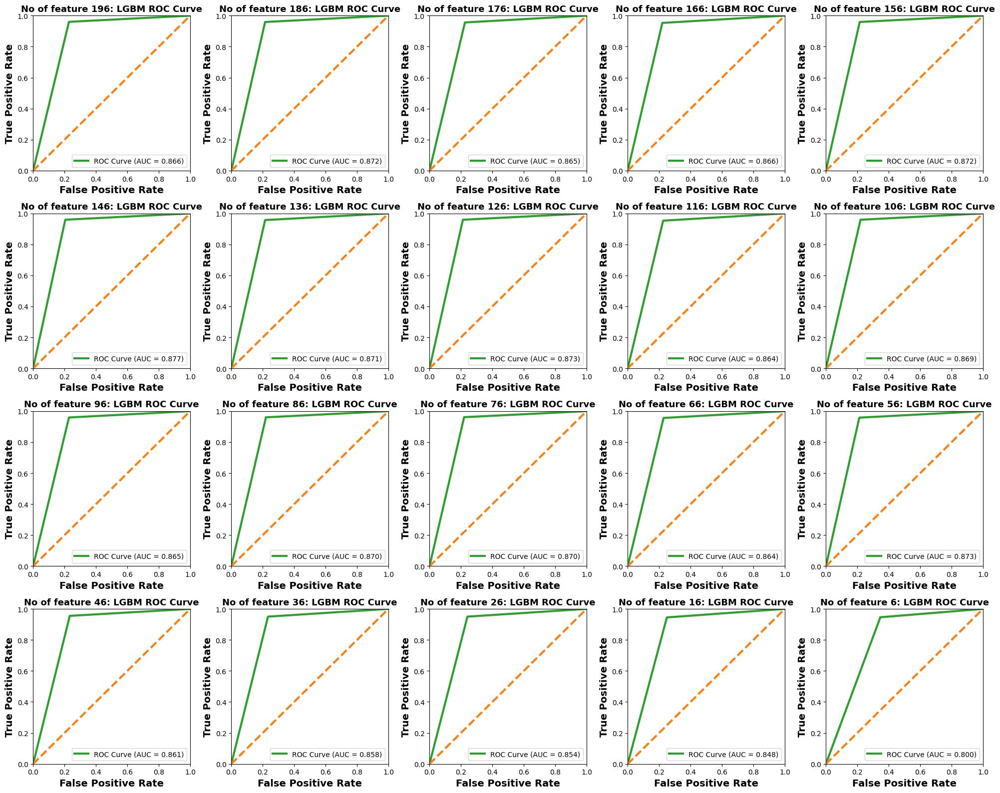

In [ ]:
plot_roc_curve(LGBM_results, 'LGBM')

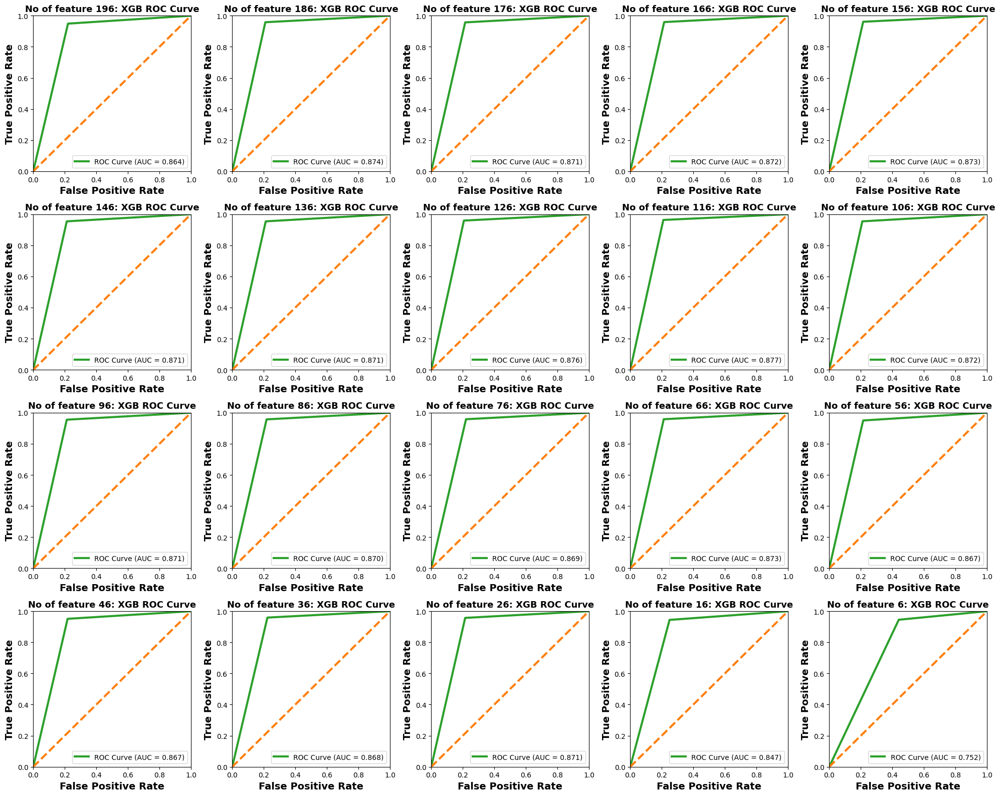

In [ ]:
plot_roc_curve(XGB_results, 'XGB')

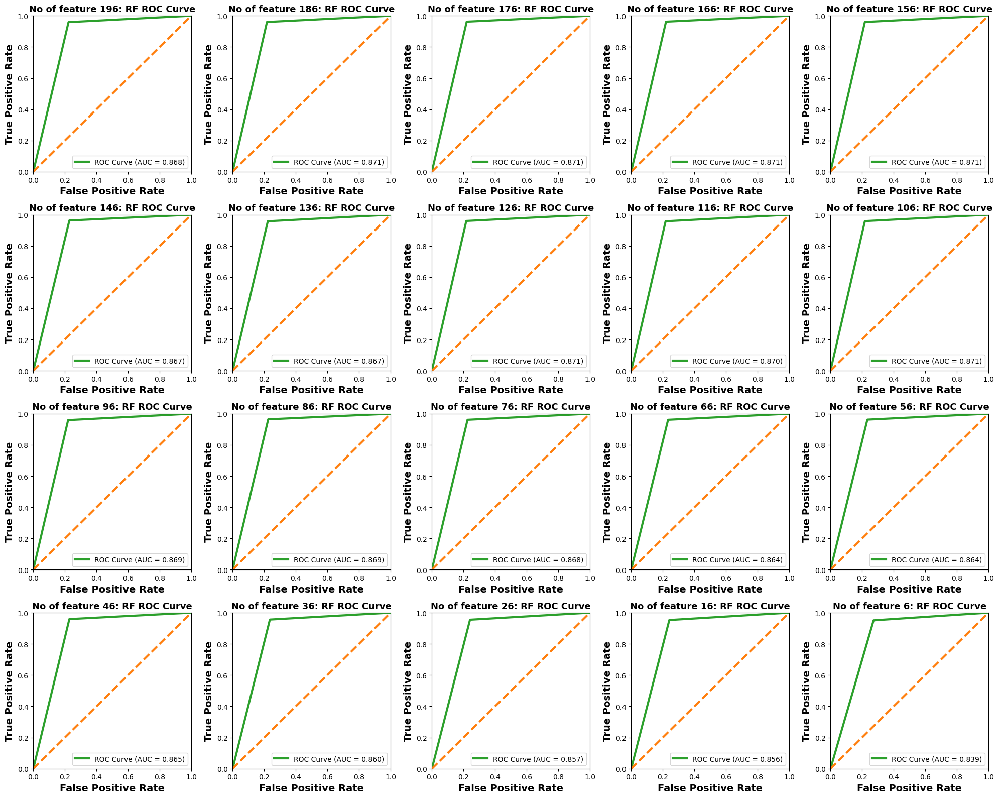

In [ ]:
plot_roc_curve(RF_results, 'RF')